## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Import Packages

In [1]:
import numpy as np
import os
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt

In [2]:
def show_images(images, rows, cols, fig_size=(10,10), glob_defined=0, title="None"):
    fig, axes = plt.subplots(rows, cols, figsize=fig_size)
    i = range(0, cols*rows)
    if(glob_defined==0):
        for ax, index, img in zip(axes.flat, i, images):
            img1 = mpimg.imread(img)
            ax.imshow(img1)
            ax.set_title(title)
    elif(glob_defined==1):
        for ax, index in zip(axes.flat, i):

            ax.imshow(images)
            ax.set_title(title)


## Raw Images

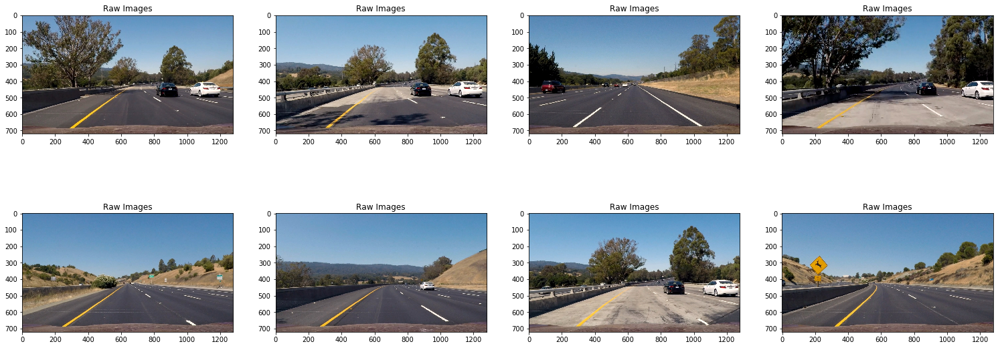

In [3]:
## Plotting Raw Images
raw_images = glob.glob("test_images/*.jpg")
show_images(raw_images, 2, 4, fig_size=(26,10), title="Raw Images")

## Camera Calibration

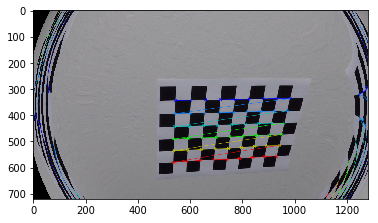

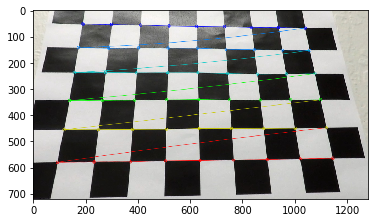

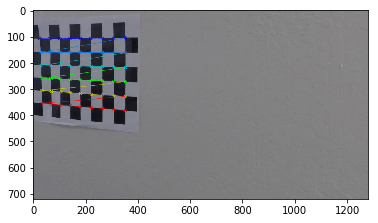

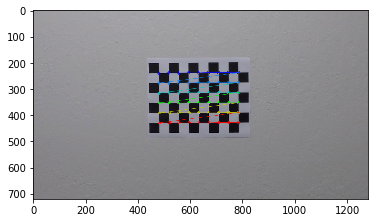

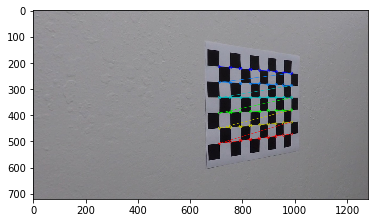

...

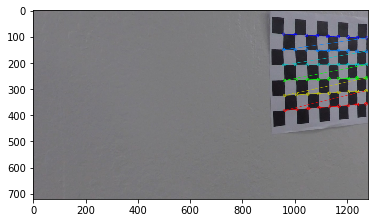

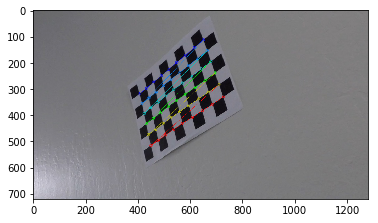

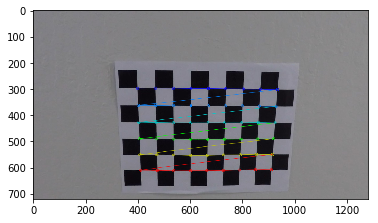

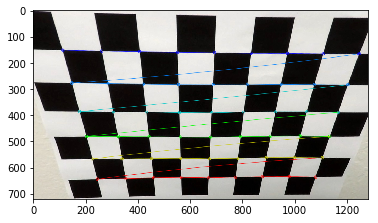

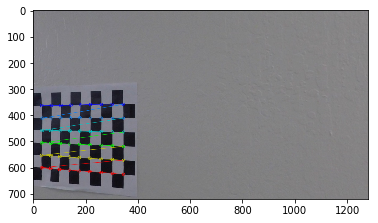

In [4]:
# Read all the image
images = glob.glob('camera_cal/calibration*.jpg')

# Arrays to store object points and image points from all the images
objpoints = []
imgpoints = []

# Prepare object points.
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)


# Read all the Images
for fname in images:
    img = mpimg.imread(fname)

    # Convert Images to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the corners in the images
    ret, corners = cv2.findChessboardCorners(img, (9,6), None)

    # Map image points and object points in the image and calibrate the camera 
    if(ret==True):
        imgpoints.append(corners)
        objpoints.append(objp)
        image = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        dst = cv2.undistort(image, mtx, dist, None, mtx)
        
        plt.imshow(dst)
        plt.show()
        cv2.imwrite("output_images/cameraCalibration.jpg", dst)

## PART 1 : GRADIENTS AND COLOR SPACES

### Undistort 

In [5]:
def undistort(image):
    undst = cv2.undistort(image, mtx, dist, None, mtx)
    return undst

### Color transforms and  Gradients

In [6]:
def hls(img):
    h = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = h[:,:,2]
    L = h[:,:,1]
    return S, L

def abs_sobel_thresh(gray, orient="x", sobel_kernel=3, thresh=(0,255)):
    
    thresh_min=thresh[0]
    thresh_max=thresh[1]
   
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    if(orient=="x"):
        abs_sobel = np.absolute(sobelx)
    elif(orient == "y"):
        abs_sobel = np.absolute(sobely)
    
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    grad_abs = np.zeros_like(scaled_sobel)
    grad_abs[(scaled_sobel>=thresh_min) & (scaled_sobel<=thresh_max)]=1
    
    return grad_abs

### Combined Threshold

In [7]:
def combined_threshold(image):
    
    s_channel, l_channel = hls(image)
    
    # Apply each of the thresholding functions
    gradx_l = abs_sobel_thresh(l_channel, orient='x', sobel_kernel=9, thresh=(25, 100))
    gradx_s = abs_sobel_thresh(s_channel, orient='x', sobel_kernel=9, thresh=(10, 200))
    grady_s = abs_sobel_thresh(s_channel, orient='y', sobel_kernel=9, thresh=(10, 200))
    
    gradxy = np.zeros_like(s_channel)
    gradxy[(gradx_s == 1)&(grady_s == 1)] = 1
    
    light_mask = np.zeros_like(l_channel)
    light_mask[(s_channel >= 10) & (l_channel >= 110)] = 1

    combined = np.zeros_like(gradx_s)
    combined[((gradx_l == 1) | (gradxy == 1)) & (light_mask == 1)] = 1
    
    return combined

### Perspective Transform

In [8]:
def perspective_transform(image):
    img_size = (img.shape[1], img.shape[0])
    offset = 200
    src = np.float32([[570,460],[705, 460], [1140,720], [190,720]])    
#     src = np.float32([[600,450],[720, 450], [1140,720], [250,720]])
#     src = np.float32([[570,450],[705, 450], [1140,720], [250,720]])  
    dst = np.float32([[offset, 0], 
                      [img_size[0]-offset, 0], 
                      [img_size[0]-offset, img_size[1]], 
                      [offset, img_size[1]]])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, Minv                                                                                          

### Processing and Plotting Image

In [9]:
def process_part1(image):
    undst = undistort(img)
    threshold = combined_threshold(undst)
    transform, Minv = perspective_transform(threshold)
    return undst, threshold, transform, Minv

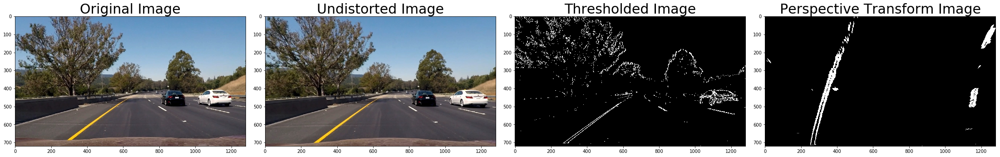

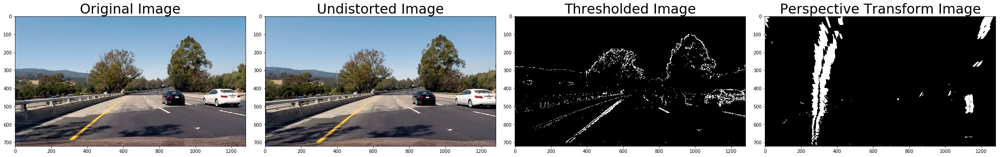

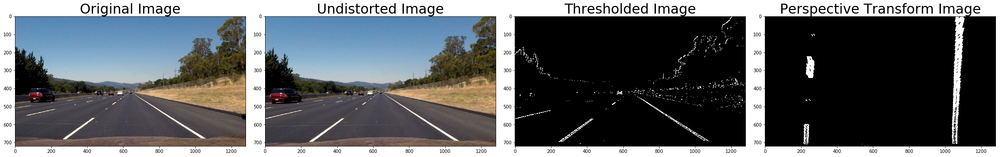

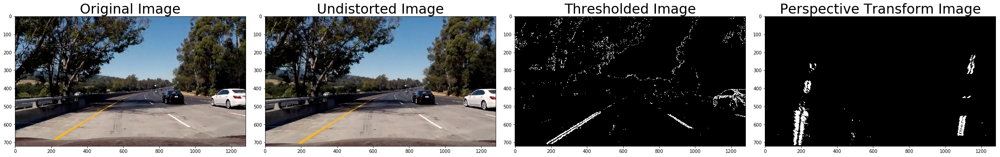

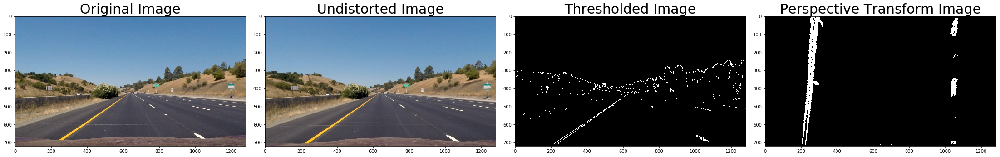

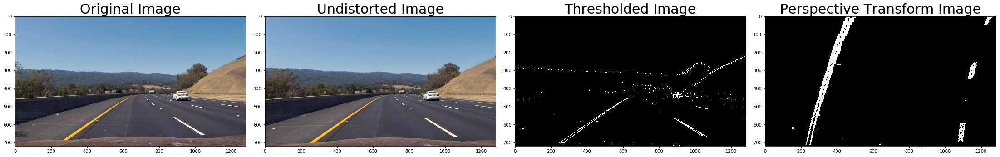

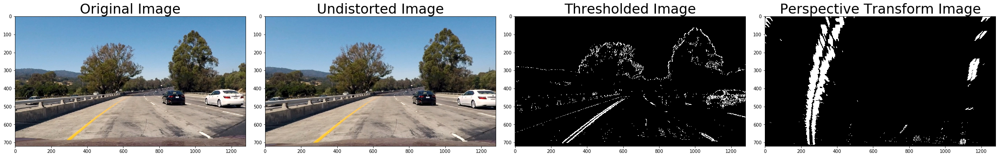

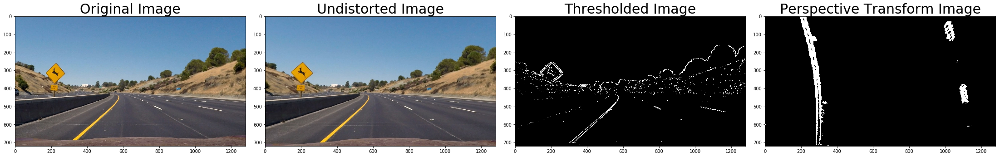

In [10]:
## Plotting Images
for fname in raw_images:
    img = mpimg.imread(fname)
    undst, threshold, transform, Minv = process_part1(img)
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 7))
    f.tight_layout()
    
    ax1.imshow(img, cmap="gray")
    ax1.set_title('Original Image', fontsize=30)
    
    ax2.imshow(undst, cmap='gray')
    ax2.set_title('Undistorted Image', fontsize=30)
    
    ax3.imshow(threshold,cmap="gray")
    ax3.set_title('Thresholded Image', fontsize=30)
    
    ax4.imshow(transform,cmap="gray")
    ax4.set_title('Perspective Transform Image', fontsize=30)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.imsave("output_images/undistort1.jpg", undst, cmap="gray")
    plt.imsave("output_images/perspective.jpg", transform, cmap="gray")
    plt.imsave("output_images/threshold.jpg", threshold, cmap="gray")

## PART 2 : ADVANCED COMPUTER VISION

In [11]:
def find_lane_pixels(binary_warped):
#     bottom_half = 0
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint]) # 327
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint # 971
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 5
    
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows) # 80
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base # 327
    rightx_current = rightx_base # 971

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
     # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height # 720 - 1*80 = 640
        win_y_high = binary_warped.shape[0] - window*window_height # 
        ### Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin # 327-100=227    
        win_xleft_high = leftx_current + margin # 327+100=427
        win_xright_low = rightx_current - margin# 971-100=871
        win_xright_high = rightx_current + margin# 971+100=1071
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low), # 227, 640, 427, 720
        (win_xleft_high,win_y_high),(0,255,0), 2)
        # cv2.rectangle(out_img,(227,640), # 227, 640, 427, 720
        # (427,720),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
   

    return leftx, lefty, rightx, righty, out_img

In [12]:
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return  out_img, left_fitx, right_fitx, ploty, left_fit, right_fit

In [13]:
def search_around_poly(binary_warped):
    # Fit new polynomials
    out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_polynomial(binary_warped)
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return out_img, left_fitx, right_fitx, ploty, left_fit, right_fit

### Draw on Image And Measure Curvature

In [18]:
def measure_curvature_pixels(img, left_fit, right_fit, ploty, left_fitx, right_fitx):
    
    y_eval = np.max(ploty)
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    camera_position = image.shape[1]/2
    lane_center = (right_fitx[719] + left_fitx[719])/2
    center_offset_pixels = abs(camera_position - lane_center)
    offset_mtrs = xm_per_pix*center_offset_pixels
    
    return left_curverad, right_curverad, offset_mtrs

In [22]:
def drawLine(img, left_fitx, right_fitx, ploty, left_fit, right_fit):
    """
    Draw the lane lines on the image `img` using the poly `left_fit` and `right_fit`.
    """
    yMax = img.shape[0]
    color_warp = np.zeros_like(img).astype(np.uint8)
    
    left_curve, right_curve, offset_mtrs = measure_curvature_pixels(img, left_fit, right_fit, ploty, left_fitx, right_fitx)
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    output = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    plt.imsave("lanes.jpg", output, cmap="gray")   
    cv2.putText(output, 'Left Curve :{:.0f} m'.format(left_curve), (50,100), cv2.FONT_HERSHEY_COMPLEX_SMALL, 3,(255,255,255),6)
    cv2.putText(output, 'Right Curve :{:.0f} m'.format(right_curve), (50,180), cv2.FONT_HERSHEY_COMPLEX_SMALL, 3,(255,255,255),6)
    cv2.putText(output, 'Center Offset :{0:.2f} m'.format(offset_mtrs), (50,260), cv2.FONT_HERSHEY_COMPLEX_SMALL, 3,(255,255,255),6)

    return output, left_curve, right_curve

In [23]:
def drawLaneOnImage(img, transform):
    """
    Find and draw the lane lines on the image `img`.
    """
    sliding_window, left_fitx, right_fitx, ploty, left_fit, right_fit  = search_around_poly(transform)
    output, left_curve, right_curve = drawLine(img, left_fitx, right_fitx, ploty, left_fit, right_fit)
    return output, left_curve, right_curve

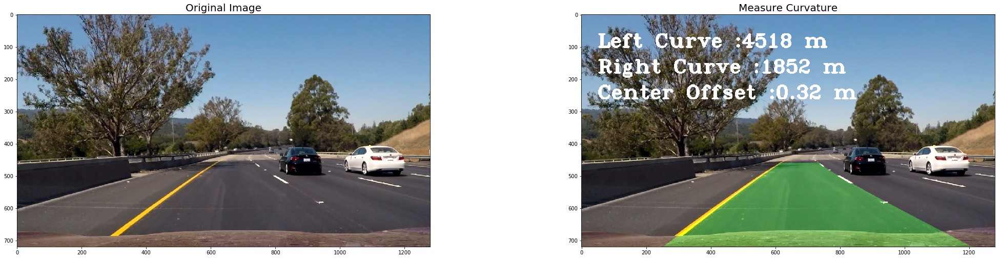

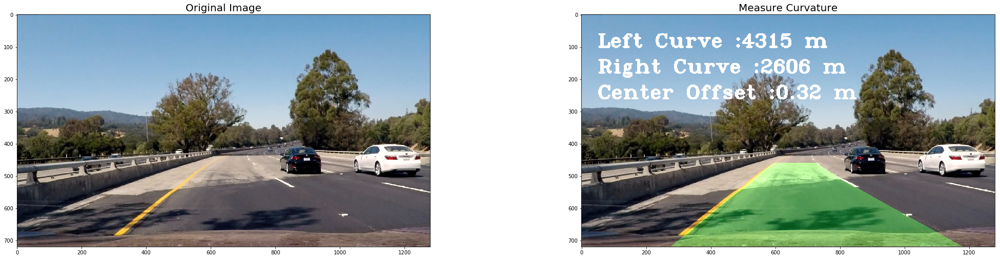

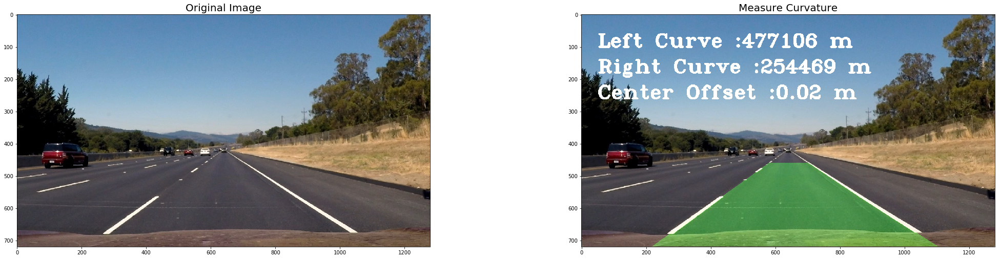

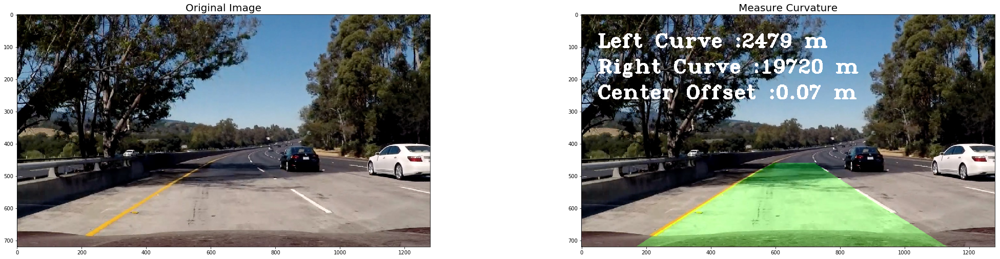

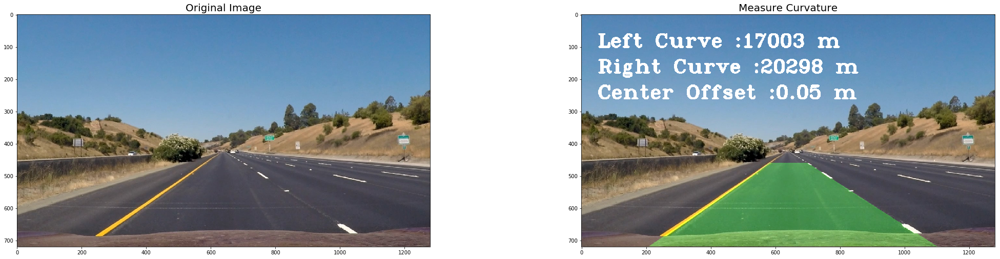

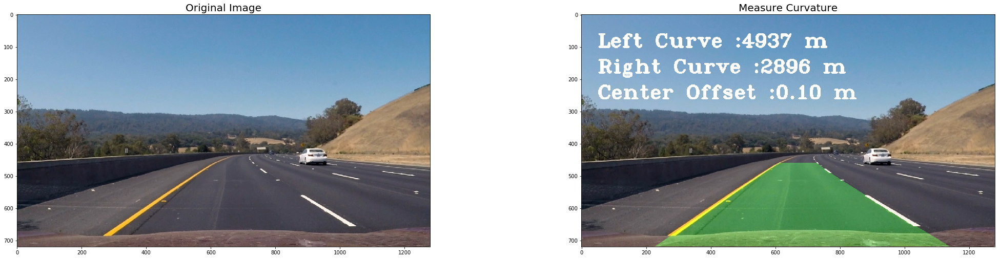

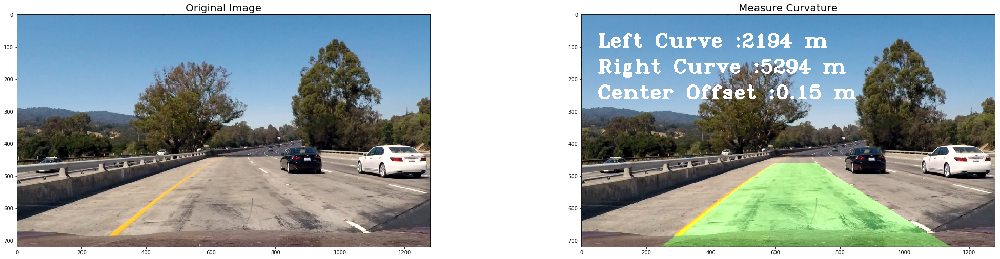

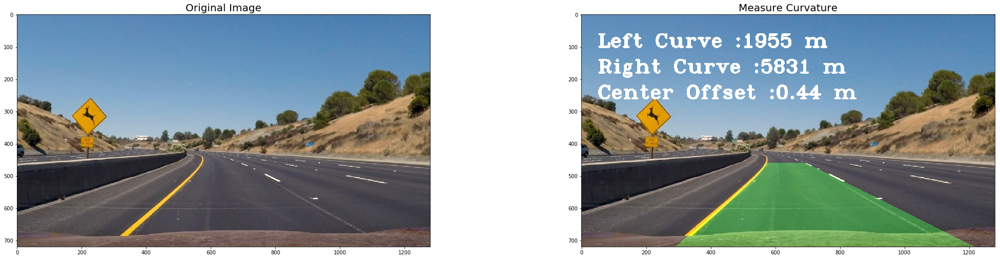

In [24]:
for fname in raw_images:
    img = mpimg.imread(fname)
    _, _, transform, Minv = process_part1(img)
    output, left_curve, right_curve = drawLaneOnImage(img, transform)
    
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 7))
    f.tight_layout()
    
    ax1.imshow(img, cmap="gray")
    ax1.set_title('Original Image', fontsize=20)
    
    ax2.imshow(output,cmap="gray")
    ax2.set_title('Measure Curvature', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

### Video

In [25]:
# !pip install imageio-ffmpeg

In [26]:
# Import everything needed to edit/save/watch video clips
import imageio
# imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from IPython.display import HTML
# import moviepy.editor as mpy

In [27]:
def processImage(img):
    undst = undistort(img)
    threshold = combined_threshold(undst)
    transform, Minv = perspective_transform(threshold)
    output, left_curve, right_curve = drawLaneOnImage(img, transform)
    return output

In [28]:
video_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(processImage) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [21:23<00:01,  1.11s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 18min 54s, sys: 4.41 s, total: 18min 58s
Wall time: 21min 26s


In [29]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))